In [2]:
import pandas as pd

df = pd.read_csv("SCYA/SCYA69_AllRVs.csv", encoding="utf-8")

## Part 1

In [3]:
df.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0_x,ID,RA,Dec,parallax,err par,pmra,err pmra,...,Unnamed: 0_y,2MASS,_RAJ2000,_DEJ2000,Jmag,e_Jmag,Hmag,e_Hmag,Kmag,e_Kmag
0,0,0,7,2156281940046733696,282.995089,60.306831,5.519626,0.386741,6.275809,0.529199,...,663552.0,18515884+6018248,282.995199,60.306904,16.593,0.134,16.004,0.183,15.270,0.180
1,1,1,9,2156868151541955712,283.367240,62.088497,5.104964,0.010914,4.573194,0.016252,...,710121.0,18532812+6205184,283.367191,62.088448,9.038,0.021,8.820,0.021,8.770,0.019
2,2,2,21,2159805982188309120,276.732006,61.889574,5.089591,0.044590,5.727655,0.064695,...,671380.0,18265567+6153223,276.731963,61.889545,13.804,0.026,13.218,0.026,12.993,0.035
3,3,3,25,2160149717011093504,278.218921,62.892100,4.952784,0.010194,2.822902,0.014131,...,694872.0,18325253+6253314,278.218911,62.892056,10.853,0.022,10.479,0.021,10.417,0.014
4,4,4,28,2160806670912304768,274.356485,63.592581,4.977892,0.227931,4.156908,0.281307,...,701658.0,18172554+6335331,274.356434,63.592529,15.842,0.059,15.237,0.079,15.033,0.133


### 1.

#### Plotting RA/DEC sky coordinates and proper motions

RA is measured from 0-360 degrees. A group of stars that is near RA = 359 and RA = 1 are close together on the sky, but on a normal plot from 0 to 360 appear far apart because they are on opposite sides of the graph
- So a solution is to plot RA value range from -180 to 180 instead of 0 to 360
- This still leaves a problem at -180/180 but for the specific cluster it will help center it 

In [4]:
# Create a new column "ra_wrapped" that is a copy of the "RA" column
df["ra_wrapped"] = df["RA"].copy()
# df["ra_wrapped"] > 180 creates boolean mask of True or False
mask = df["ra_wrapped"] > 180
# loc lets you target a specific subset of the dataframe:
# loc just selects a rows and a columns so df.loc[which_rows, which_columns]
# Then df.loc[mask, "ra_wrapped"] selects the rows where the mask is True and column is "ra_wrapped"
df.loc[mask, "ra_wrapped"] = df.loc[mask, "ra_wrapped"] - 360

In [5]:
print(df[["RA", "ra_wrapped"]])

              RA  ra_wrapped
0     282.995089  -77.004911
1     283.367240  -76.632760
2     276.732006  -83.267994
3     278.218921  -81.781079
4     274.356485  -85.643515
...          ...         ...
1373  265.522457  -94.477543
1374  268.927195  -91.072805
1375  268.529999  -91.470001
1376  266.325286  -93.674714
1377  244.166231 -115.833769

[1378 rows x 2 columns]


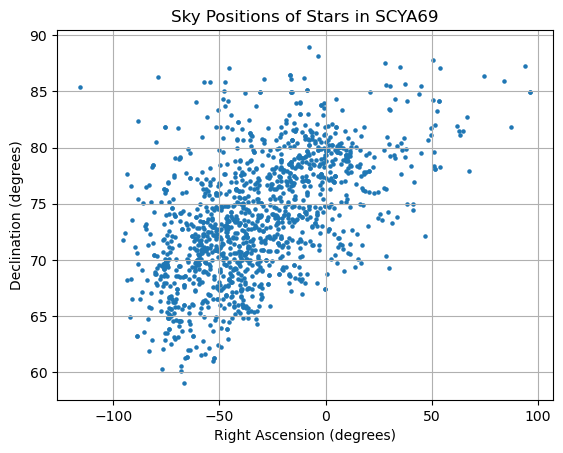

In [6]:
import matplotlib.pyplot as plt
plt.scatter(df["ra_wrapped"], df["Dec"], s = 5)
plt.xlabel("Right Ascension (degrees)")
plt.ylabel("Declination (degrees)")
plt.title("Sky Positions of Stars in SCYA69")
plt.grid()
plt.show()

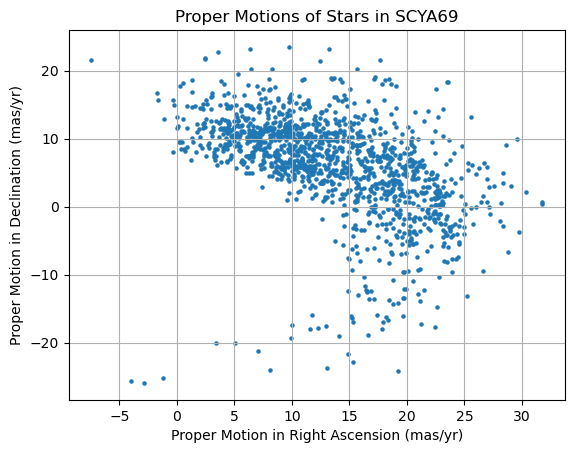

In [7]:
plt.scatter(df["pmra"], df["pmdec"], s = 5)
plt.xlabel("Proper Motion in Right Ascension (mas/yr)")
plt.ylabel("Proper Motion in Declination (mas/yr)")
plt.title("Proper Motions of Stars in SCYA69")
plt.grid()
plt.show()

### 2.

In [8]:
###useful functions############################
###note: let me know if any important statements are missing, I may not have gotten them all

import numpy as np
from astropy import units as u
import astropy.coordinates as coord
from astropy.coordinates import SkyCoord

###Imports for pyutils functions:
from pyutils.ACRastro.gal_uvw import gal_uvw
from pyutils.gal_xyz import gal_xyz

def gal(r, d): #input RA/Dec sky coords, output l/b galactic sky coords
    d = SkyCoord(ra=r*u.degree, dec=d*u.degree, frame='icrs')
    gd = d.transform_to('galactic')
    agl, agb = gd.l, gd.b
    return agl.value, agb.value

def pmgal(ra, dec, pmra, pmdec): #input RA, Dec and proper motion in RA, Dec, return proper motion l,b
    ipmt = coord.SkyCoord(ra=ra*u.degree, dec=dec*u.degree, pm_ra_cosdec=pmra*u.mas/u.yr,
                          pm_dec=pmdec*u.mas/u.yr, frame='icrs')
    pmg = ipmt.transform_to(coord.Galactic)
    pml, pmb = pmg.pm_l_cosb, pmg.pm_b
    return pml, pmb

def propmot(ra, dec, dist, U, V, W): #input RA, Dec, Distance, and UVW cartesian velocity, return RV and proper motion in RA, Dec
    # Ensure inputs are numpy arrays
    ra = np.asarray(ra)
    dec = np.asarray(dec)
    dist = np.asarray(dist)
    U = np.asarray(U)
    V = np.asarray(V)
    W = np.asarray(W)

    # Transformation matrix TM
    TM = np.array([[-0.06699, -0.87276, -0.48354],
                   [0.49273, -0.45035, 0.74458],
                   [-0.86760, -0.18837, 0.46020]])

    # Create the output array
    num_points = ra.size
    sol = np.zeros((3, num_points))

    # Loop over each data point
    for i in range(num_points):
        # Trigonometric terms
        cosd = np.cos(np.deg2rad(dec[i]))
        sind = np.sin(np.deg2rad(dec[i]))
        cosa = np.cos(np.deg2rad(ra[i]))
        sina = np.sin(np.deg2rad(ra[i]))

        # Transformation matrix AM for each data point
        AM = np.array([[cosa * cosd, -sina, -cosa * sind],
                       [sina * cosd, cosa, -sina * sind],
                       [sind,        0,    cosd]])

        # Matrix multiplication
        BM = np.matmul(TM, AM).T

        # Solve for radial velocity and proper motions
        sol[:, i] = np.matmul(BM, np.array([U[i], V[i], W[i]]))

    # Convert proper motions to mas/yr
    plx = 1e3 / dist
    sol[1, :] = sol[1, :] * plx / 4.74047
    sol[2, :] = sol[2, :] * plx / 4.74047

    return sol

def Vt(pml, pmb, d): #insert proper motion in l, b and distance, return transverse velocities in l, b
    d = d*u.pc  #distance in pc
    vtl = d*pml.value/206264807.*pctokm*u.km**-1
    vtb = d*pmb.value/206264807.*pctokm*u.km**-1
    return (vtl/ytos).value, (vtb/ytos).value

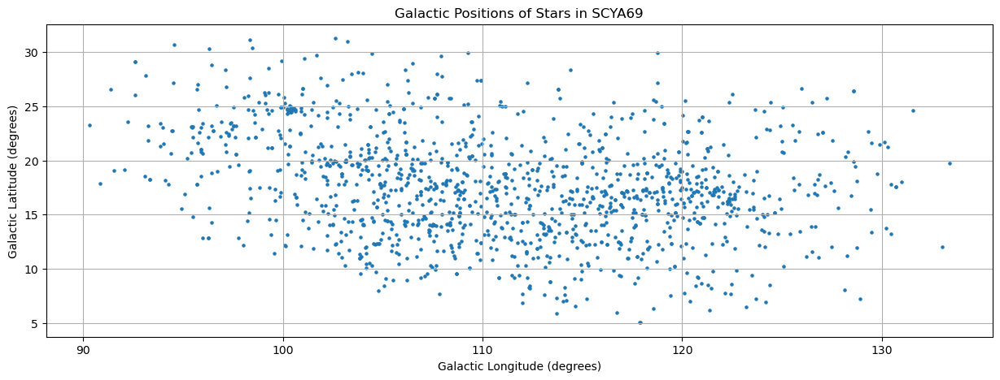

In [9]:
# Converting RA/DEC to l/b galactic coordinates:

l, b = gal(df["RA"].values, df["Dec"].values)
plt.figure(figsize=(15, 5))
plt.scatter(l, b, s = 5)
plt.xlabel("Galactic Longitude (degrees)")
plt.ylabel("Galactic Latitude (degrees)")
plt.title("Galactic Positions of Stars in SCYA69")
plt.grid()
plt.show()

##### **Does the interactive figure have any additional quality cuts or something to it? There seems to be less CFN points in the interactive model. Both lie in the same range of l and b coords, but the spatial distirbution and the number of points do not look the exact same

### 3.

In [10]:
from pyutils.gal_xyz import gal_xyz


In [11]:
X, Y, Z = gal_xyz(df["RA"].values, df["Dec"].values, df["d"].values, radec= True, plx = False)
# Input is RA/DEC and (radec = True) and parallax is false since input is distance (plx = False)

In [12]:
help(gal_xyz)

Help on function gal_xyz in module pyutils.gal_xyz:

gal_xyz(ll, bb, dd, radec=False, plx=True, reverse=False)
    #import time
    ##import pdb



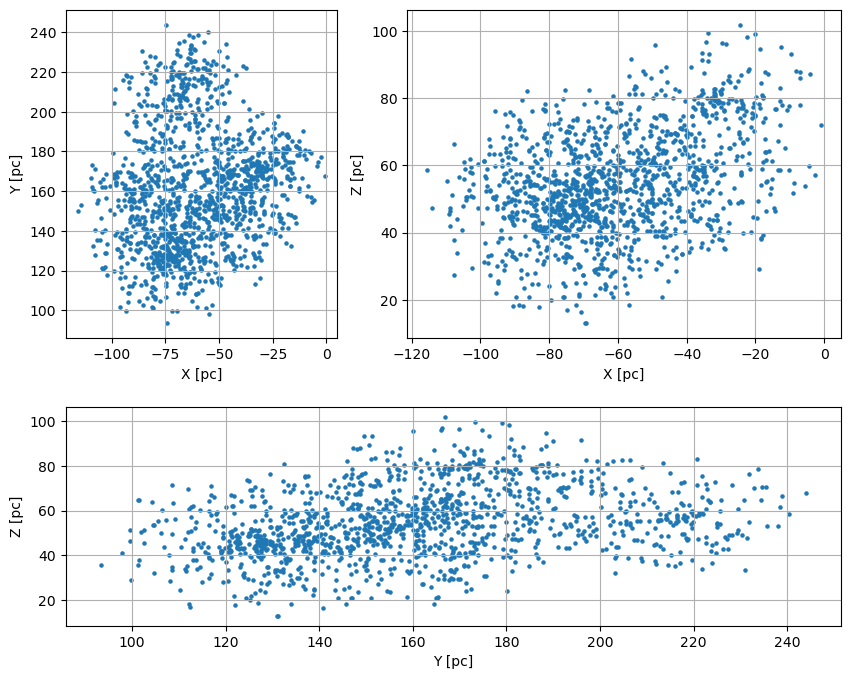

In [13]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(10, 8))

gs = gridspec.GridSpec(
    2, 2,
    height_ratios=[3, 2],
    width_ratios=[1, 1.6],
    hspace=0.25,
    wspace=0.20
)

ax0 = fig.add_subplot(gs[0, 0])   # top left
ax1 = fig.add_subplot(gs[0, 1])   # top right
ax2 = fig.add_subplot(gs[1, :])   # bottom spans both columns

ax0.scatter(X,Y, s=5)
ax0.set_xlabel("X [pc]")
ax0.set_ylabel("Y [pc]")
ax0.grid()

ax1.scatter(X, Z, s=5)
ax1.set_xlabel("X [pc]")
ax1.set_ylabel("Z [pc]")
ax1.grid()

ax2.scatter(Y, Z, s=5)
ax2.set_xlabel("Y [pc]")
ax2.set_ylabel("Z [pc]")
ax2.grid()

plt.show()


Plots look the same as those compared to the SPYGLASS II Fig 6. It may be my eyes but once again it looks like there might be more data points in this data then what is plotted so wondering if there have been anymore quality/other cuts to the data. 

### 4.

##### Note was getting an error on not having pctokm defined so I just assumed it meant pc to km and then filled that in but it might be that it meant something else?

In [14]:
pctokm = 3.0856775814913673e13  # km per pc
ytos = 365.25 * 24 * 60 * 60    # seconds per year

pml, pmb = pmgal(df["RA"].values, df["Dec"].values, df["pmra"].values, df["pmdec"].values)
Vt_l, Vt_b = Vt(pml, pmb, df["d"].values)

### 5.

Constructing a function to plot the Colour Magnitude Diagram (CMD)

In [15]:
def plot_cmd(data, pmem_cut= None):
    """
    Plot Gaia absolute G magnitude vs Gaia BP-RP colour.

    Parameters
    ----------
    data : pandas.DataFrame
        Dataframe containing g, bp, rp, d, and optionally Pmem.
    pmem_cut : float or None
        If given, only plot stars with Pmem > pmem_cut.
    """

    # Pmem cuts for threshold of membership probabilities
    if pmem_cut is not None:
        mask = data["Pmem"] > pmem_cut
        data = data[mask] # Only include data from the boolean mask 

    # Calculate BP-RP color (G) and absolute G magnitude
    bp_rp = data["bp"] - data["rp"]
    M_G = data["g"] - 5*np.log10(data["d"]) + 5

    plt.figure(figsize=(6, 7))
    plt.scatter(bp_rp, M_G, s=5)

    plt.xlabel("Gaia BP - RP")
    plt.ylabel("Absolute Gaia G Magnitude")
    
    if pmem_cut is None:
        plt.title("CMD of SCYA69")
    else:
        plt.title(f"CMD of SCYA69, Pmem > {pmem_cut}")

    plt.gca().invert_yaxis()
    plt.grid()
    plt.show()


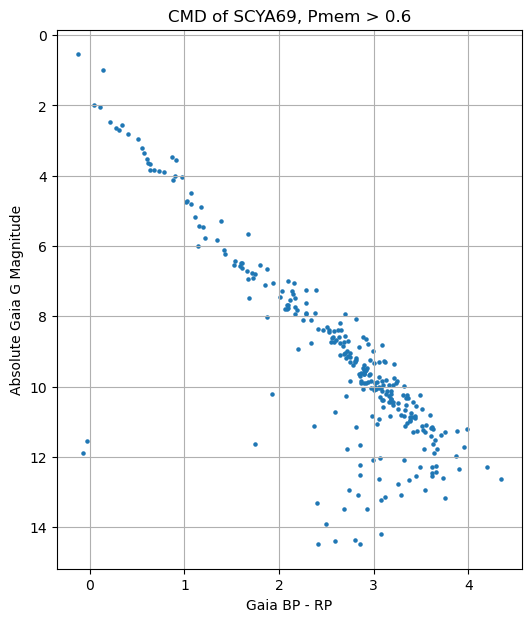

In [16]:
plot_cmd(df, pmem_cut=0.6)

In [17]:
def plot_cmd_highlight(data, pmem_cut=None):
    if pmem_cut is not None:
        data = data[data["Pmem"] > pmem_cut]

    bp_rp = data["bp"] - data["rp"]
    M_G = data["g"] - 5*np.log10(data["d"]) + 5

    plt.figure(figsize=(6, 7))
    sc = plt.scatter(
        bp_rp,
        M_G,
        c=data["Pmem"],
        s=8,
        cmap="viridis",
        alpha=0.8
    )

    plt.colorbar(sc, label="Pmem")
    plt.xlabel("Gaia BP - RP")
    plt.ylabel("Absolute Gaia G")
    plt.title("CMD of SCYA69 colored by membership probability")
    plt.gca().invert_yaxis()
    plt.grid()
    plt.show()


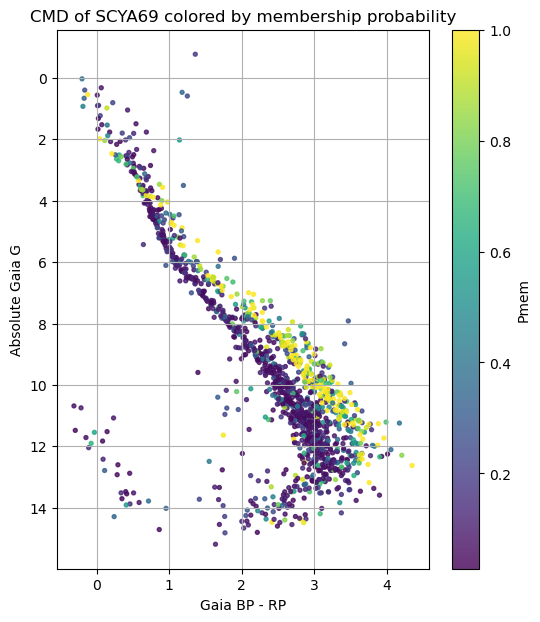

In [18]:
plot_cmd_highlight(df)

### 6.

$P_{young}$: Measures the photometric youth probability assuming the average occurrence rate of young stars in the galaxy

$strength$: Measure of closeness to other stars in the population

$founding$: High -Pyoung stars that HDBSCAN clustering used to define the extent of the
population. 



##### a) $P_{young}$ in spatial, proper motion, and color-magnitude space

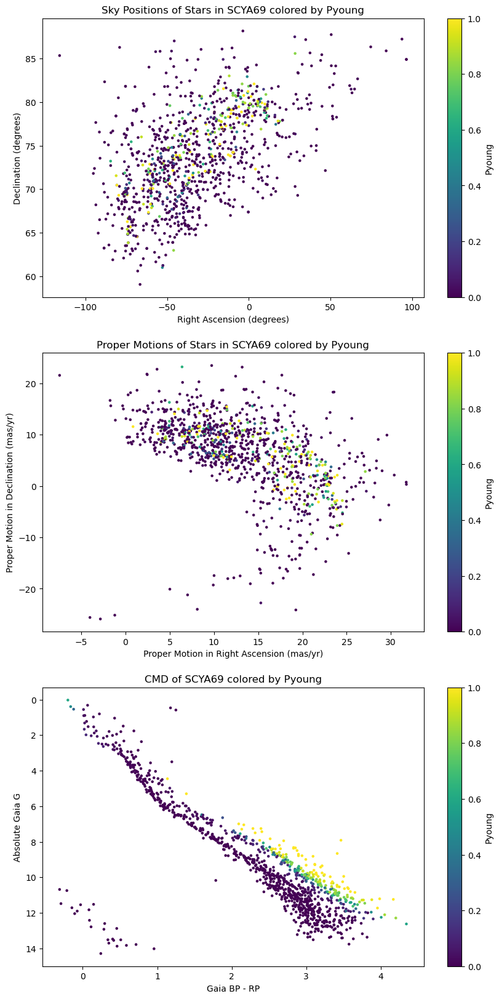

In [19]:
def continuous_pyoung(df):
    bp_rp = df["bp"] - df["rp"]
    M_G = df["g"] - 5*np.log10(df["d"]) + 5

    fig, axs = plt.subplots(3, 1, figsize=(10,20))  # 3 rows, 1 column
    axs[0].scatter(df["ra_wrapped"], df["Dec"], c=df["Pyoung"], s=5, cmap="viridis")
    axs[0].set_xlabel("Right Ascension (degrees)")
    axs[0].set_ylabel("Declination (degrees)")
    axs[0].set_title("Sky Positions of Stars in SCYA69 colored by Pyoung")

    axs[1].scatter(df["pmra"], df["pmdec"], c=df["Pyoung"], s=5, cmap="viridis")
    axs[1].set_xlabel("Proper Motion in Right Ascension (mas/yr)")
    axs[1].set_ylabel("Proper Motion in Declination (mas/yr)")
    axs[1].set_title("Proper Motions of Stars in SCYA69 colored by Pyoung")

    axs[2].scatter(bp_rp, M_G, c=df["Pyoung"], s=5, cmap="viridis")
    axs[2].set_xlabel("Gaia BP - RP")
    axs[2].set_ylabel("Absolute Gaia G")
    axs[2].invert_yaxis()
    axs[2].set_title("CMD of SCYA69 colored by Pyoung")

    plt.colorbar(axs[0].collections[0], label="Pyoung")
    plt.colorbar(axs[1].collections[0], label="Pyoung")
    plt.colorbar(axs[2].collections[0], label="Pyoung")

continuous_pyoung(df)

Instead of a continuous distirbution, we can also plot this into three value categories (tri flags)
- In the SPYGLASS Program we define Pyoung > 0.2 as definitively young stars, P < 0.001 as definitely old stars, and the rest intermediate
- We can plot with these flags to give us a better understanding of the distribution of young and old stars present 

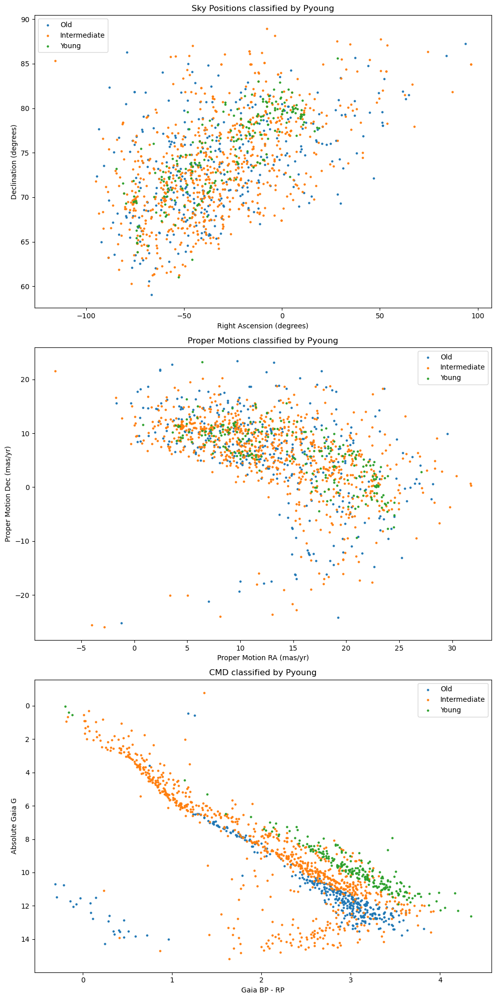

In [20]:
def tri_flag_pyoung(df):

    bp_rp = df["bp"] - df["rp"]
    M_G = df["g"] - 5*np.log10(df["d"]) + 5
    
    # Define masks
    young = df["Pyoung"] > 0.2
    old = df["Pyoung"] < 0.001
    mid = (~young) & (~old)

    # Create figure
    fig, axs = plt.subplots(3, 1, figsize=(10, 20))


    # Spatial Distribution


    axs[0].scatter(df["ra_wrapped"][old],
                df["Dec"][old],
                s=5,
                label="Old")

    axs[0].scatter(df["ra_wrapped"][mid],
                df["Dec"][mid],
                s=5,
                label="Intermediate")

    axs[0].scatter(df["ra_wrapped"][young],
                df["Dec"][young],
                s=5,
                label="Young")

    axs[0].set_xlabel("Right Ascension (degrees)")
    axs[0].set_ylabel("Declination (degrees)")
    axs[0].set_title("Sky Positions classified by Pyoung")
    axs[0].legend()

    # Proper Motion

    axs[1].scatter(df["pmra"][old],
                df["pmdec"][old],
                s=5,
                label="Old")

    axs[1].scatter(df["pmra"][mid],
                df["pmdec"][mid],
                s=5,
                label="Intermediate")

    axs[1].scatter(df["pmra"][young],
                df["pmdec"][young],
                s=5,
                label="Young")

    axs[1].set_xlabel("Proper Motion RA (mas/yr)")
    axs[1].set_ylabel("Proper Motion Dec (mas/yr)")
    axs[1].set_title("Proper Motions classified by Pyoung")
    axs[1].legend()


    # Colour Magnitude Distribution


    axs[2].scatter(bp_rp[old],
                M_G[old],
                s=5,
                label="Old")

    axs[2].scatter(bp_rp[mid],
                M_G[mid],
                s=5,
                label="Intermediate")

    axs[2].scatter(bp_rp[young],
                M_G[young],
                s=5,
                label="Young")

    axs[2].set_xlabel("Gaia BP - RP")
    axs[2].set_ylabel("Absolute Gaia G")
    axs[2].invert_yaxis()
    axs[2].set_title("CMD classified by Pyoung")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

tri_flag_pyoung(df)

##### b) Strength in spatial, proper motion, colour magnitude 

I think this is best represented by a continuous distirbution as we are looking at HOW centrally embedded a star is within the population. There is no central or non-central that feels natural to define, as a star can be central, moderately distributed, edge of population, a far outskirt etc...

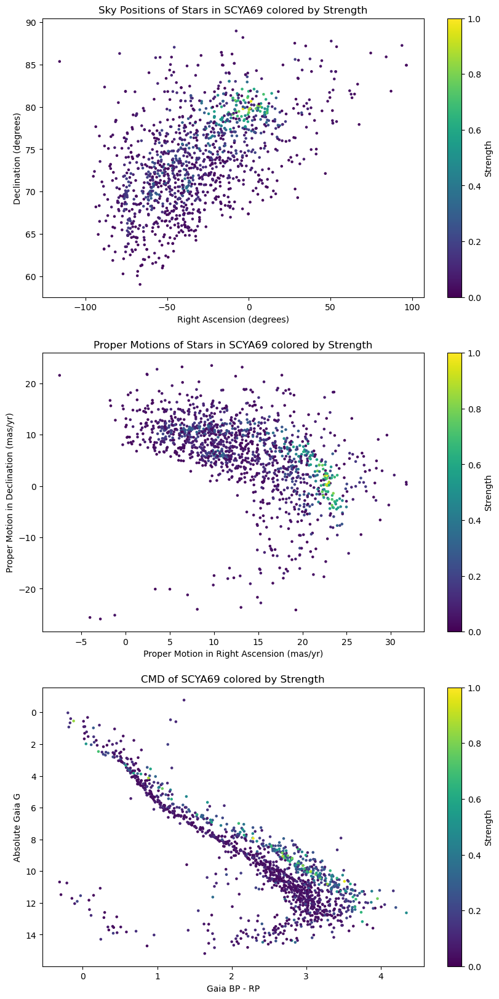

In [21]:
def continuous_strength(df):
    bp_rp = df["bp"] - df["rp"]
    M_G = df["g"] - 5*np.log10(df["d"]) + 5

    fig, axs = plt.subplots(3, 1, figsize=(10, 20))  # 3 rows, 1 column
    axs[0].scatter(df["ra_wrapped"], df["Dec"], c=df["strength"], s=5, cmap="viridis")
    axs[0].set_xlabel("Right Ascension (degrees)")
    axs[0].set_ylabel("Declination (degrees)")
    axs[0].set_title("Sky Positions of Stars in SCYA69 colored by Strength")

    axs[1].scatter(df["pmra"], df["pmdec"], c=df["strength"], s=5, cmap="viridis")
    axs[1].set_xlabel("Proper Motion in Right Ascension (mas/yr)")
    axs[1].set_ylabel("Proper Motion in Declination (mas/yr)")
    axs[1].set_title("Proper Motions of Stars in SCYA69 colored by Strength")

    axs[2].scatter(bp_rp, M_G, c=df["strength"], s=5, cmap="viridis")
    axs[2].set_xlabel("Gaia BP - RP")
    axs[2].set_ylabel("Absolute Gaia G")
    axs[2].invert_yaxis()
    axs[2].set_title("CMD of SCYA69 colored by Strength")

    plt.colorbar(axs[0].collections[0], label="Strength")
    plt.colorbar(axs[1].collections[0], label="Strength")
    plt.colorbar(axs[2].collections[0], label="Strength")

continuous_strength(df)

##### b) Founding in spatial, proper motion, colour magnitude 

Already a binary flag 

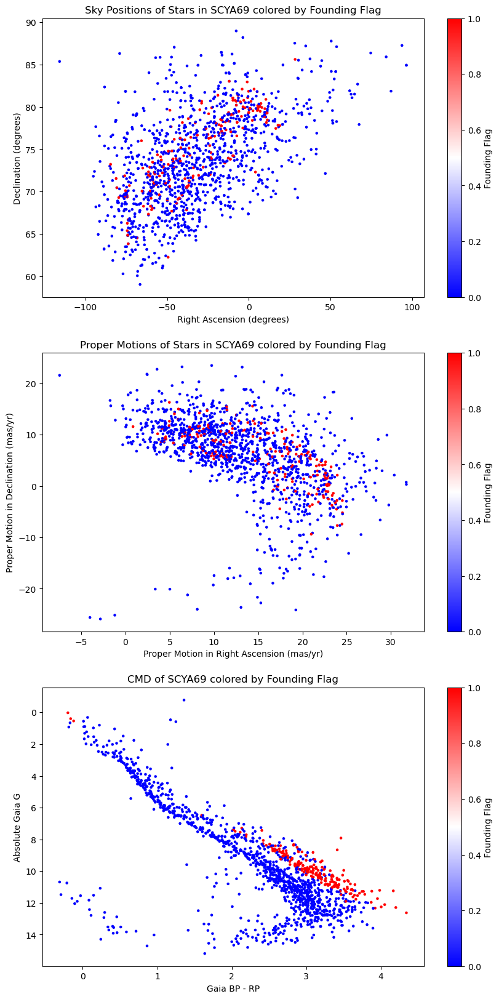

In [22]:
def binary_founding(df):
    bp_rp = df["bp"] - df["rp"]
    M_G = df["g"] - 5*np.log10(df["d"]) + 5

    fig, axs = plt.subplots(3, 1, figsize=(10, 20))  # 3 rows, 1 column
    axs[0].scatter(df["ra_wrapped"], df["Dec"], c=df["founding"], s=5, cmap='bwr')
    axs[0].set_xlabel("Right Ascension (degrees)")
    axs[0].set_ylabel("Declination (degrees)")
    axs[0].set_title("Sky Positions of Stars in SCYA69 colored by Founding Flag")

    axs[1].scatter(df["pmra"], df["pmdec"], c=df["founding"], s=5, cmap='bwr')
    axs[1].set_xlabel("Proper Motion in Right Ascension (mas/yr)")
    axs[1].set_ylabel("Proper Motion in Declination (mas/yr)")
    axs[1].set_title("Proper Motions of Stars in SCYA69 colored by Founding Flag")

    axs[2].scatter(bp_rp, M_G, c=df["founding"], s=5, cmap='bwr')
    axs[2].set_xlabel("Gaia BP - RP")
    axs[2].set_ylabel("Absolute Gaia G")
    axs[2].invert_yaxis()
    axs[2].set_title("CMD of SCYA69 colored by Founding Flag")

    plt.colorbar(axs[0].collections[0], label="Founding Flag")
    plt.colorbar(axs[1].collections[0], label="Founding Flag")
    plt.colorbar(axs[2].collections[0], label="Founding Flag")

binary_founding(df)

##### Comparing Pyoung, Strength, and Founding Flag

The goal of these plots is to compare three different ways of identifying likely young cluster members: `Pyoung`, `strength`, and the `founding` flag.

`Pyoung` and `strength` are continuous values, while `founding` is already a binary flag. This makes them harder to compare directly because the color scales do not represent the same kind of information. To make the comparison fair, we convert `Pyoung` and `strength` into binary flags using chosen cutoff values. Stars above the cutoff are assigned one color, and stars below the cutoff are assigned another color, just like the `founding` flag.

This allows us to visually compare whether the same stars are being selected by each method.


In [23]:
import numpy as np
import matplotlib.pyplot as plt

def add_binary_flags(df, pyoung_cutoff=0.2, strength_cutoff=0.5):
    df = df.copy()

    if "ra_wrapped" not in df.columns:
        df["ra_wrapped"] = df["RA"].copy()
        mask = df["ra_wrapped"] > 180
        df.loc[mask, "ra_wrapped"] = df.loc[mask, "ra_wrapped"] - 360

    df["Pyoung_flag"] = df["Pyoung"] >= pyoung_cutoff
    df["strength_flag"] = df["strength"] >= strength_cutoff
    df["founding_flag"] = df["founding"].astype(bool)

    return df


def plot_binary_comparison(df, pyoung_cutoff=0.2, strength_cutoff=0.5):
    df = add_binary_flags(
        df,
        pyoung_cutoff=pyoung_cutoff,
        strength_cutoff=strength_cutoff
    )

    bp_rp = df["bp"] - df["rp"]
    M_G = df["g"] - 5 * np.log10(df["d"]) + 5

    flags = {
        f"Pyoung >= {pyoung_cutoff}": "Pyoung_flag",
        f"Strength >= {strength_cutoff}": "strength_flag",
        "Founding Flag": "founding_flag",
    }

    views = [
        {
            "name": "Spatial",
            "x": df["ra_wrapped"],
            "y": df["Dec"],
            "xlabel": "Right Ascension (degrees)",
            "ylabel": "Declination (degrees)",
            "invert_y": False,
        },
        {
            "name": "Proper Motion",
            "x": df["pmra"],
            "y": df["pmdec"],
            "xlabel": "Proper Motion RA (mas/yr)",
            "ylabel": "Proper Motion Dec (mas/yr)",
            "invert_y": False,
        },
        {
            "name": "CMD",
            "x": bp_rp,
            "y": M_G,
            "xlabel": "Gaia BP - RP",
            "ylabel": "Absolute Gaia G",
            "invert_y": True,
        },
    ]

    fig, axs = plt.subplots(3, 3, figsize=(15, 15))

    false_color = "tab:blue"
    true_color = "tab:red"

    for row, view in enumerate(views):
        xlim = (np.nanmin(view["x"]), np.nanmax(view["x"]))
        ylim = (np.nanmin(view["y"]), np.nanmax(view["y"]))

        for col, (flag_label, flag_col) in enumerate(flags.items()):
            ax = axs[row, col]

            selected = df[flag_col]
            not_selected = ~selected

            ax.scatter(
                view["x"][not_selected],
                view["y"][not_selected],
                s=5,
                color=false_color,
                label="False",
                alpha=0.7
            )

            ax.scatter(
                view["x"][selected],
                view["y"][selected],
                s=5,
                color=true_color,
                label="True",
                alpha=0.9
            )

            ax.set_xlim(xlim)
            ax.set_ylim(ylim)

            if view["invert_y"]:
                ax.invert_yaxis()

            ax.set_xlabel(view["xlabel"])
            ax.set_ylabel(view["ylabel"])
            ax.set_title(f"{view['name']}: {flag_label}")
            ax.legend(markerscale=3)

    plt.tight_layout()
    plt.show()

    return df


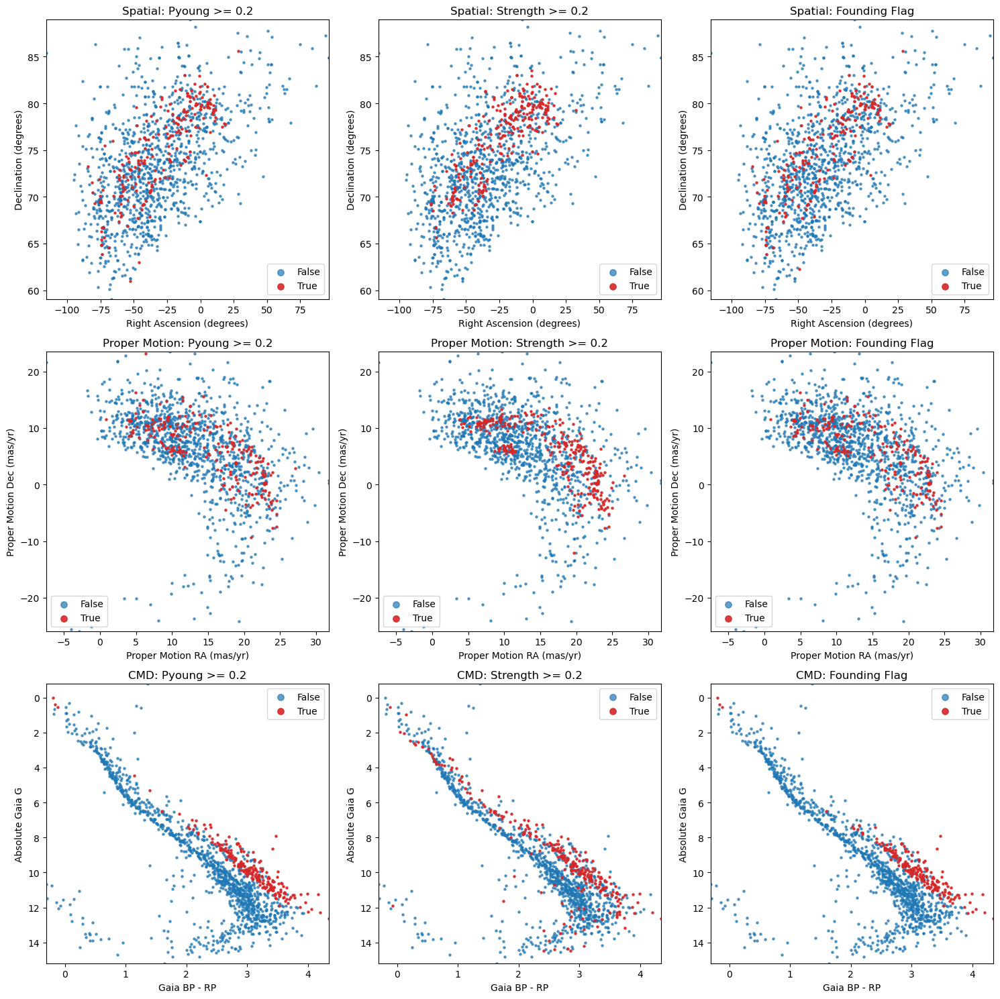

In [24]:
df_binary = plot_binary_comparison(df, pyoung_cutoff=0.2, strength_cutoff=0.2)


In [25]:
import numpy as np
import matplotlib.pyplot as plt

def plot_continuous_and_founding_comparison(df):
    
    #Change RA to be wrapped from -180 to 180 degrees instead of 0 to 360 for better visualization in spatial plot
    df["ra_wrapped"] = df["RA"].copy()
    mask = df["ra_wrapped"] > 180
    df.loc[mask, "ra_wrapped"] = df.loc[mask, "ra_wrapped"] - 360
    
    bp_rp = df["bp"] - df["rp"]
    M_G = df["g"] - 5 * np.log10(df["d"]) + 5

    views = [
        {
            "name": "Spatial",
            "x": df["ra_wrapped"],
            "y": df["Dec"],
            "xlabel": "Right Ascension (degrees)",
            "ylabel": "Declination (degrees)",
            "invert_y": False,
        },
        {
            "name": "Proper Motion",
            "x": df["pmra"],
            "y": df["pmdec"],
            "xlabel": "Proper Motion RA (mas/yr)",
            "ylabel": "Proper Motion Dec (mas/yr)",
            "invert_y": False,
        },
        {
            "name": "CMD",
            "x": bp_rp,
            "y": M_G,
            "xlabel": "Gaia BP - RP",
            "ylabel": "Absolute Gaia G",
            "invert_y": True,
        },
    ]

    fig, axs = plt.subplots(3, 3, figsize=(16, 15))

    for row, view in enumerate(views):
        xlim = (np.nanmin(view["x"]), np.nanmax(view["x"]))
        ylim = (np.nanmin(view["y"]), np.nanmax(view["y"]))

        # Pyoung continuous colour map
        sc0 = axs[row, 0].scatter(
            view["x"],
            view["y"],
            c=df["Pyoung"],
            s=5,
            cmap="viridis"
        )
        axs[row, 0].set_title(f"{view['name']}: Pyoung")
        plt.colorbar(sc0, ax=axs[row, 0], label="Pyoung")

        # Strength continuous colour map
        sc1 = axs[row, 1].scatter(
            view["x"],
            view["y"],
            c=df["strength"],
            s=5,
            cmap="viridis"
        )
        axs[row, 1].set_title(f"{view['name']}: Strength")
        plt.colorbar(sc1, ax=axs[row, 1], label="Strength")

        # Founding binary flag
        founding_true = df["founding"].astype(bool)
        founding_false = ~founding_true

        axs[row, 2].scatter(
            view["x"][founding_false],
            view["y"][founding_false],
            s=5,
            color="tab:blue",
            label="False",
            alpha=0.7
        )

        axs[row, 2].scatter(
            view["x"][founding_true],
            view["y"][founding_true],
            s=5,
            color="tab:red",
            label="True",
            alpha=0.9
        )

        axs[row, 2].set_title(f"{view['name']}: Founding Flag")
        axs[row, 2].legend(markerscale=3)

        for col in range(3):
            axs[row, col].set_xlim(xlim)
            axs[row, col].set_ylim(ylim)

            if view["invert_y"]:
                axs[row, col].invert_yaxis()

            axs[row, col].set_xlabel(view["xlabel"])
            axs[row, col].set_ylabel(view["ylabel"])

    plt.tight_layout()
    plt.show()


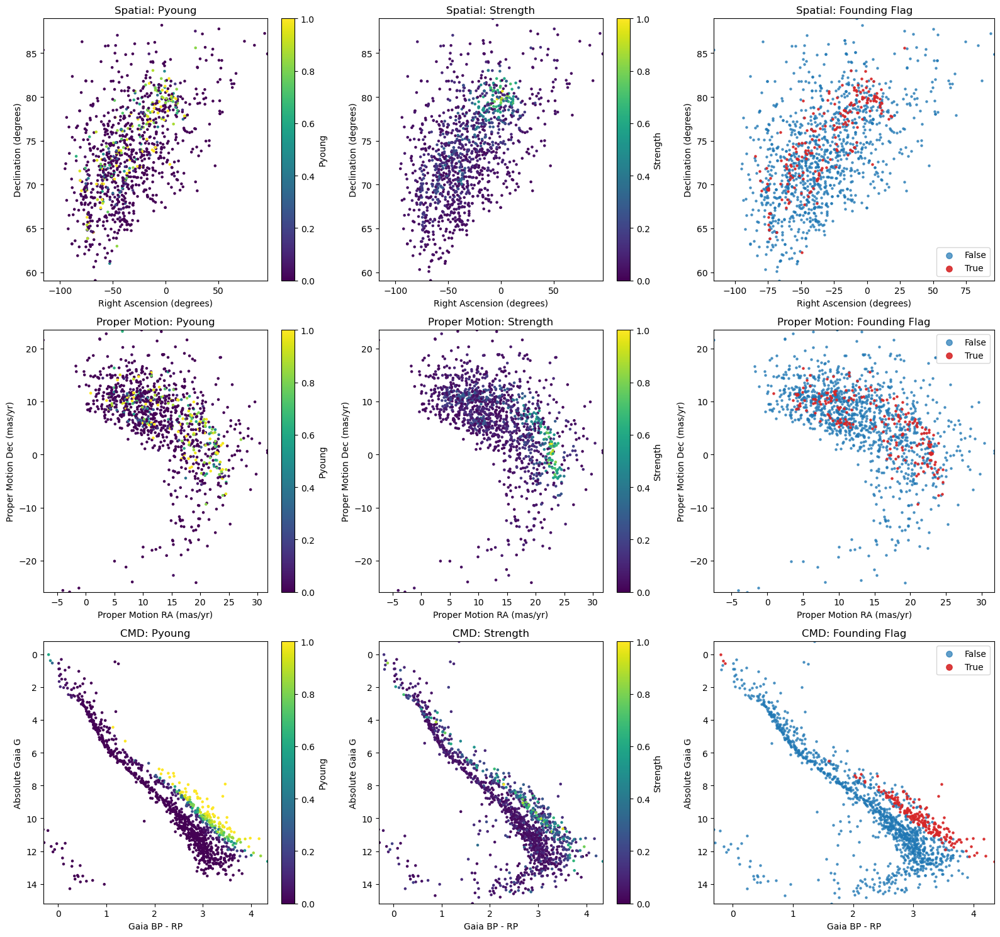

In [26]:
plot_continuous_and_founding_comparison(df)



#### Interpretations of SCYA69 Distribution - How they differ for each marker:

**CMD**

Pyoung stars seems like the strongest discriminator in color–magnitude space. We see a steady rise from stars on the main sequence to the pre main sequence, with their probabiity of being young consistnently increasing indicating that they are correctly distinguishing young from old

- The strength CMD seems to be more broadly selected and less confined to the PMS branch. We see that there are some high strength candidates still selected higher along the CMD because they are deeply embedded in the cluster even though not young. Since most stars embedded in the cluster will be young (as we can see), there still may be some that are older and so they are still being selected as we move up the main sequence

- The founding distribution is similar to the high-Pyoung distribution because founding stars are selected from photometrically young stars (so if we select a cut of Pyoung > 0.2 we get similar distirbutions). However, founding excludes some high-Pyoung stars that do not match the spatial or proper-motion coherence of the main group, meaning they may be young-looking contaminants, peripheral members, or stars outside the dense cluster core.
- CMD founding flag does produce a pretty good distribution of the cluster including stars on the PMS and a couple OB stars that is a good indicator of a young cluster

**Spatial distribution**

Unlike the pre-main sequence CMD, Pyoung stars seem to be relatively dispersed in spatial and proper motion distributions. We see a large spread of the Pyoung ranges within the other two distributions. So while they preferentially occupy the main association structure, they are not confined exclusively to the densest regions.

Strength is clearly a better indicator in this region, as it should be (since it measures the densities of stars essentially). Looking at the continuous colour plot, we can see that there is a dense cluster of stars at a strength of 0.6-0.8, and that the strength then falls off and throughout the rest of the plot are distributed at a strength of around 0.4

Foundation does not give a great indication of trends in the spatial and proper motion plots as it is simply a binary flag



### 6. 
#### CG26


In [27]:
df_CG26 = pd.read_csv("SCYA/CLUSTER_EXTENDED_CG26.csv", encoding="utf-8")

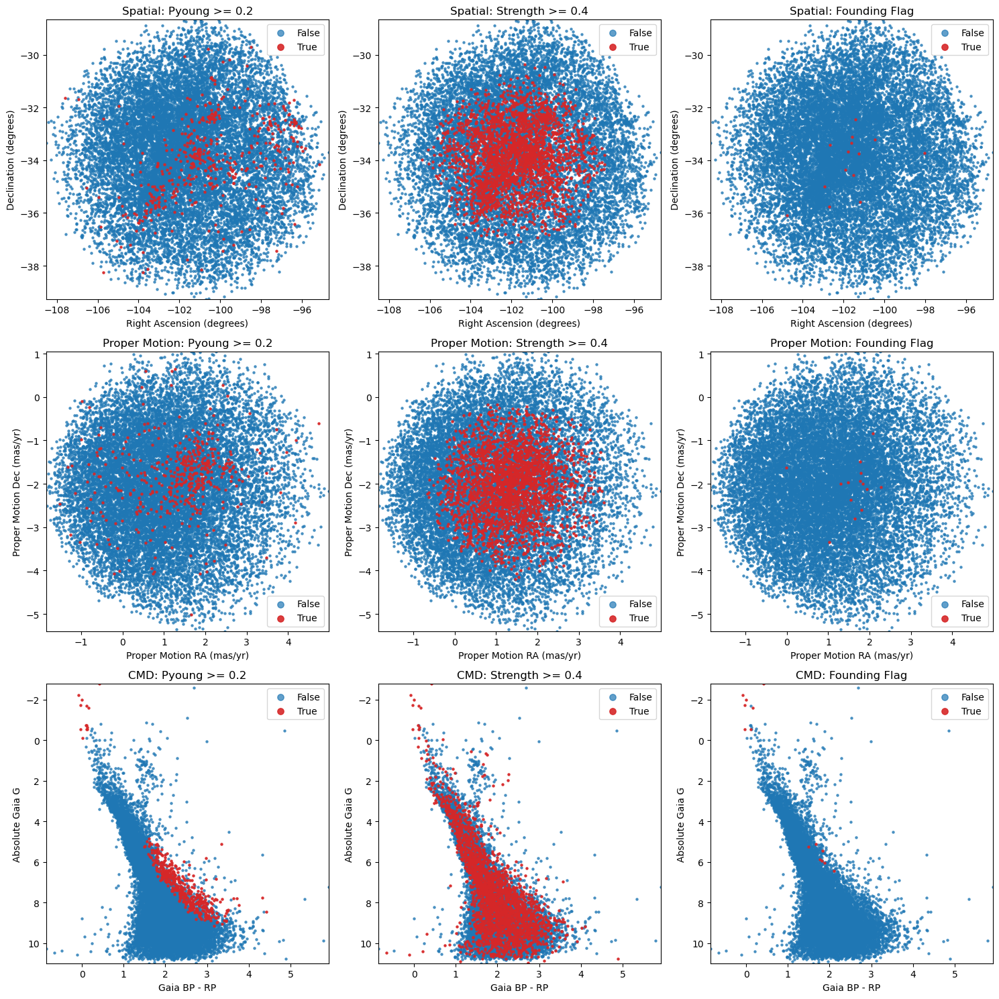

In [37]:
df_CG26_binary = plot_binary_comparison(df_CG26, pyoung_cutoff=0.2, strength_cutoff=0.4)

Since this is an extended population, it was hard to see the important data so write another continuous code called plot_continuous_and_founding_comparison_overlay that makes low-value points transparent/smaller,
plotting high-value points on top, and making founding red points larger with black edges.

In [29]:
import numpy as np
import matplotlib.pyplot as plt

def plot_continuous_and_founding_comparison_overlay(df):
    df = df.copy()

    # RA wrapping
    df["ra_wrapped"] = df["RA"].copy()
    mask = df["ra_wrapped"] > 180
    df.loc[mask, "ra_wrapped"] = df.loc[mask, "ra_wrapped"] - 360

    # CMD quantities
    bp_rp = df["bp"] - df["rp"]
    M_G = df["g"] - 5 * np.log10(df["d"]) + 5

    views = [
        ["Spatial", df["ra_wrapped"], df["Dec"],
         "Right Ascension (degrees)", "Declination (degrees)", False],

        ["Proper Motion", df["pmra"], df["pmdec"],
         "Proper Motion RA (mas/yr)", "Proper Motion Dec (mas/yr)", False],

        ["CMD", bp_rp, M_G,
         "Gaia BP - RP", "Absolute Gaia G", True],
    ]

    fig, axs = plt.subplots(3, 3, figsize=(16, 15))

    founding_true = df["founding"].astype(bool)
    founding_false = ~founding_true

    for row, (name, x, y, xlabel, ylabel, invert_y) in enumerate(views):

        xlim = (np.nanmin(x), np.nanmax(x))
        ylim = (np.nanmin(y), np.nanmax(y))

        # Sort so high values are plotted on top
        pyoung_order = np.argsort(df["Pyoung"].values)
        strength_order = np.argsort(df["strength"].values)

        # Better color scaling
        pyoung_vmin = np.nanpercentile(df["Pyoung"], 1)
        pyoung_vmax = np.nanpercentile(df["Pyoung"], 99)

        strength_vmin = np.nanpercentile(df["strength"], 1)
        strength_vmax = np.nanpercentile(df["strength"], 99)

        # Pyoung continuous
        sc0 = axs[row, 0].scatter(
            x.iloc[pyoung_order] if hasattr(x, "iloc") else x[pyoung_order],
            y.iloc[pyoung_order] if hasattr(y, "iloc") else y[pyoung_order],
            c=df["Pyoung"].iloc[pyoung_order],
            s=6,
            cmap="viridis",
            alpha=0.75,
            vmin=pyoung_vmin,
            vmax=pyoung_vmax
        )
        axs[row, 0].set_title(f"{name}: Pyoung")
        plt.colorbar(sc0, ax=axs[row, 0], label="Pyoung")

        # Strength continuous
        sc1 = axs[row, 1].scatter(
            x.iloc[strength_order] if hasattr(x, "iloc") else x[strength_order],
            y.iloc[strength_order] if hasattr(y, "iloc") else y[strength_order],
            c=df["strength"].iloc[strength_order],
            s=6,
            cmap="viridis",
            alpha=0.75,
            vmin=strength_vmin,
            vmax=strength_vmax
        )
        axs[row, 1].set_title(f"{name}: Strength")
        plt.colorbar(sc1, ax=axs[row, 1], label="Strength")

        # Founding flag: false first, true second
        axs[row, 2].scatter(
            x[founding_false],
            y[founding_false],
            s=3,
            color="tab:blue",
            label="False",
            alpha=0.25
        )

        axs[row, 2].scatter(
            x[founding_true],
            y[founding_true],
            s=35,
            color="tab:red",
            edgecolor="black",
            linewidth=0.4,
            label="True",
            alpha=1.0
        )

        axs[row, 2].set_title(f"{name}: Founding Flag")
        axs[row, 2].legend(markerscale=1.5)

        for col in range(3):
            axs[row, col].set_xlim(xlim)
            axs[row, col].set_ylim(ylim)

            if invert_y:
                axs[row, col].invert_yaxis()

            axs[row, col].set_xlabel(xlabel)
            axs[row, col].set_ylabel(ylabel)

    plt.tight_layout()
    plt.show()

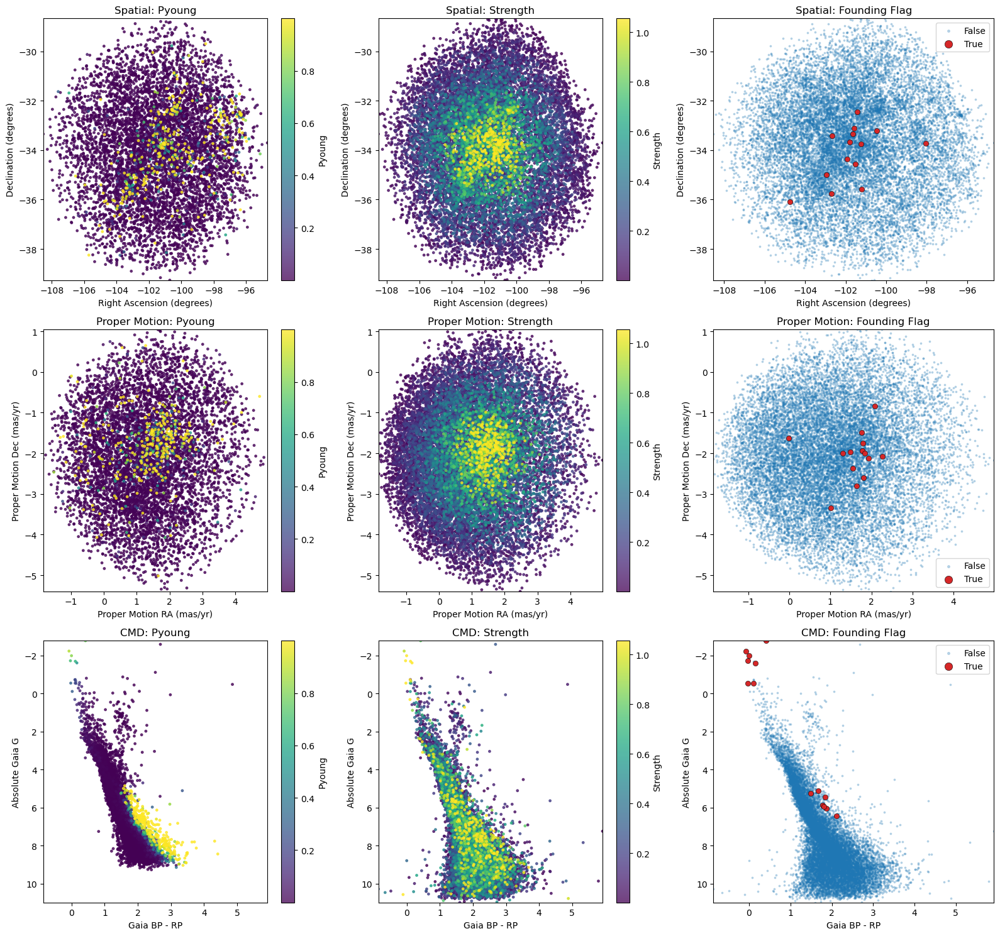

In [30]:
plot_continuous_and_founding_comparison_overlay(df_CG26)

#### Interpretations of CG26 Distribution - How they differ for each marker:

**CMD**

- Pyoung most strongly isolates the PMS. High-Pyoung stars are concentrated along the red pre-main-sequence branch and avoid the dense lower field-star population (as expected)
- I am putting a **special note of interest** down for the foundation stars because there appears to be very few, and they seem to be in problematic areas
    - It looks that the identified foundational members in a range of 1.5 < G < 2.5, which is not necessarily in the redenning concern region of 0.5 < G < 1.5 but is still odd that it did not identify any in the obvious pre-main sequence area 
    - Perhaps this is still part of the PMS CMD but it is generally unclear 
    - It does however include a bunch of O/B stars which are always a good indicator of a young cluster
- Strength is also less clear as it is less selective photometrically so it is not a good indicator

**Spatial Distribution**

- Pyoung is the most spatially dispersed. High-Pyoung stars are spread broadly throughout the association and do not strongly isolate the central core which suggests that many stars appear photometrically young even far from the densest region of the population.
- Strength gives a clear distirbution of central concetration. The highest-strength stars form a smooth dense core near the middle of the distribution, with strength gradually decreasing outward. This is the expected distribution of a cluster 
 This indicates that strength is tracing the local density structure of the association much more directly than photometric youth.

 **Proper Motion**

 Same idea here strength provides the best kinematic structure

 Overall, the founding stars are much fewer and trace only a small high-confidence seed near the core. Therefore, the three diagnostics are not identifying completely separate populations, but they emphasize different parts of the same extended structure.

#### SCYA6

In [31]:
df_6 = pd.read_csv("SCYA/SCYA6_AllRVs.csv", encoding="utf-8")

/tmp/ipykernel_165025/3577160383.py:106: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/akauffman/.conda/envs/myenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


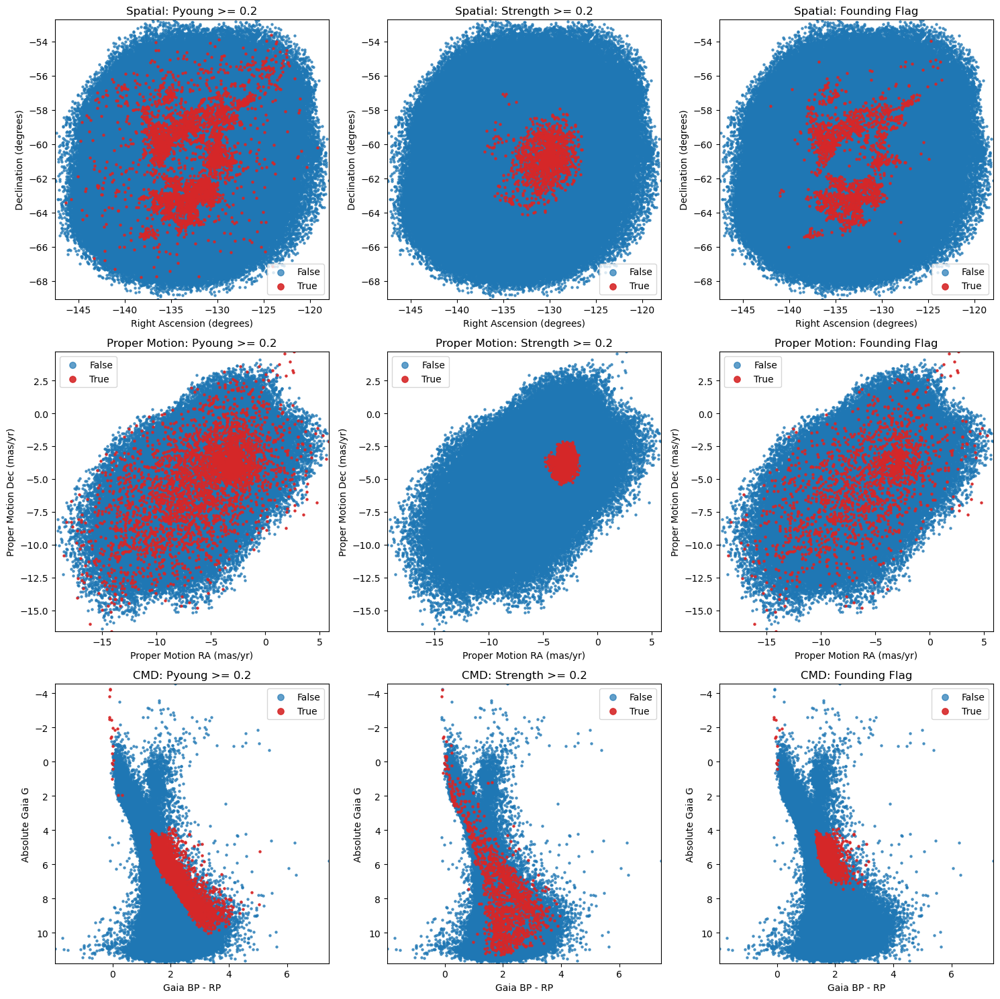

In [32]:
df_6_binary = plot_binary_comparison(df_6, pyoung_cutoff=0.2, strength_cutoff=0.2)

/tmp/ipykernel_165025/1231402652.py:110: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/akauffman/.conda/envs/myenv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


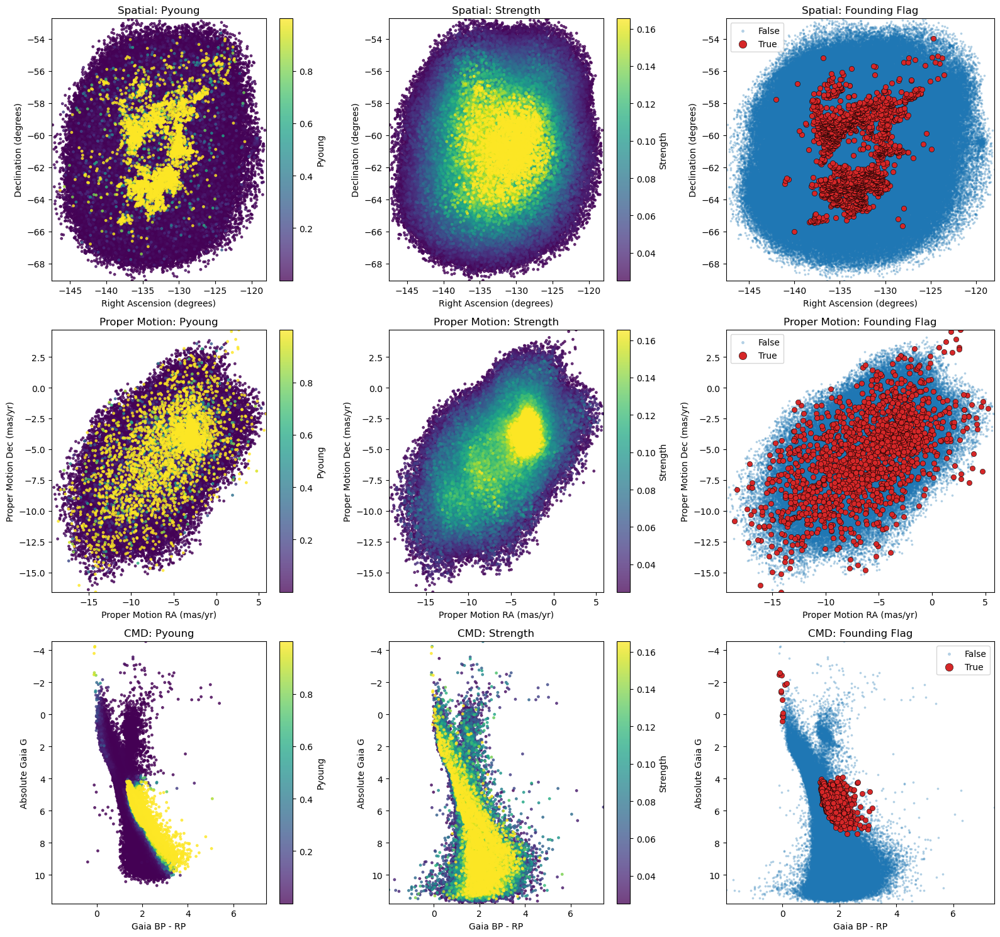

In [33]:
plot_continuous_and_founding_comparison_overlay(df_6)

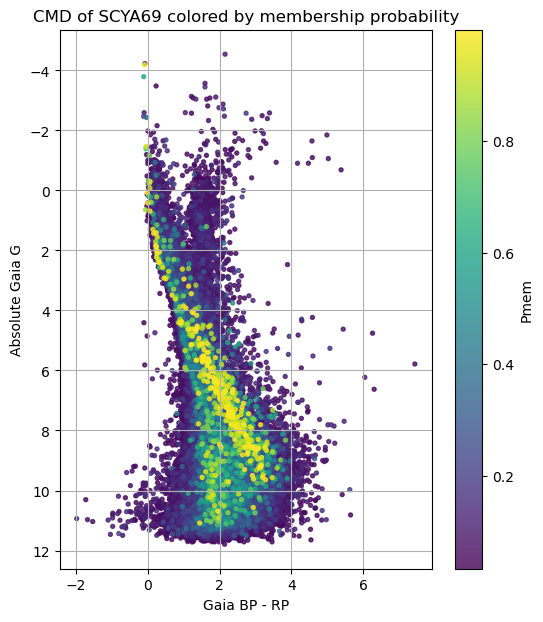

In [40]:
def plot_cmd_highlight_overlay(data, pmem_cut=None):
    if pmem_cut is not None:
        data = data[data["Pmem"] > pmem_cut].copy()
    else:
        data = data.copy()

    # Sort so low Pmem points are plotted first,
    # and high Pmem points are plotted last/on top.
    data = data.sort_values("Pmem")

    bp_rp = data["bp"] - data["rp"]
    M_G = data["g"] - 5 * np.log10(data["d"]) + 5

    plt.figure(figsize=(6, 7))
    sc = plt.scatter(
        bp_rp,
        M_G,
        c=data["Pmem"],
        s=8,
        cmap="viridis",
        alpha=0.8
    )

    plt.colorbar(sc, label="Pmem")
    plt.xlabel("Gaia BP - RP")
    plt.ylabel("Absolute Gaia G")
    plt.title("CMD of SCYA69 colored by membership probability")
    plt.gca().invert_yaxis()
    plt.grid()
    plt.show()

plot_cmd_highlight_overlay(df_6)

#### Interpretations of the SCYA6 Distribution 

In the founding stars, I am flagging the distribution on the CMD. Unless this population is very far, and thus we aren't able to resolve a lot of the low mass stars so they don't make it past quality cuts, the distribution should not be clustered in the middle of the diagram. While they did not identify points on the PMS, it looks like it could be affected by reddening or something. Founding stars are slightly above/right of the normal main sequence which can indicate a young pre-main-sequence population, or unresolved binaries, reddening/extinction effects, or some mixture of these. Since we don't see an extended distribution below it seems like we might have encountered on of the problems. 

Additionally, if you look at the strength's spatial distribution and CMD, you see that the closest members, ie. central part of the cluster lies along the main sequence, possibly indicating an older cluster. We don't see a washed out distirbution like in the example above, it is all Strength = 1 members filling up the entire main sequence which makes it seem like this cluster might be on the older side.

The spatial distribution has an interesting morphology where high Pyoung stars are not concentrated or spread out approximately uniformly like we have seen before, but instead trace multiple elongated substrcutres. However strength acts as a much smoother indicator of where the field lies. 

#### SCYA72

In [34]:
df_72 = pd.read_csv("SCYA/SCYA72_AllRVs.csv", encoding="utf-8")

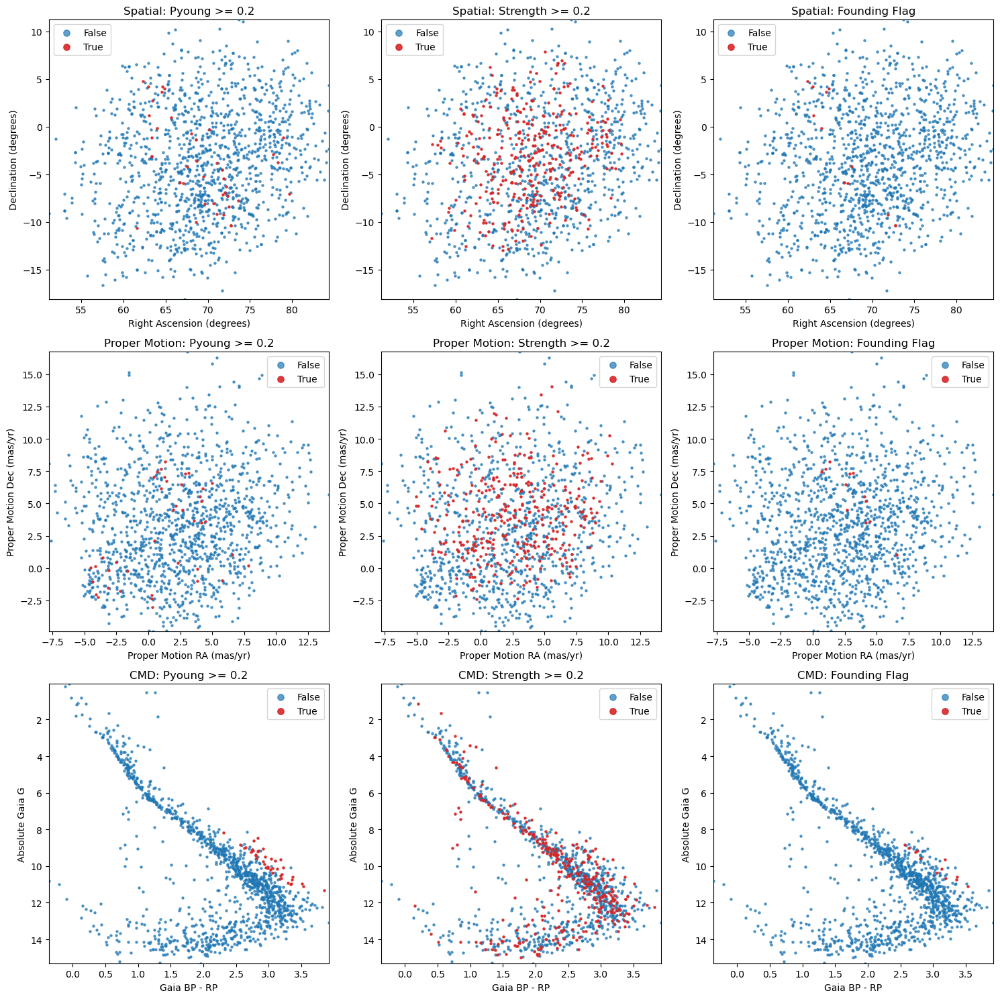

In [35]:
df_72_binary = plot_binary_comparison(df_72, pyoung_cutoff=0.2, strength_cutoff=0.2)

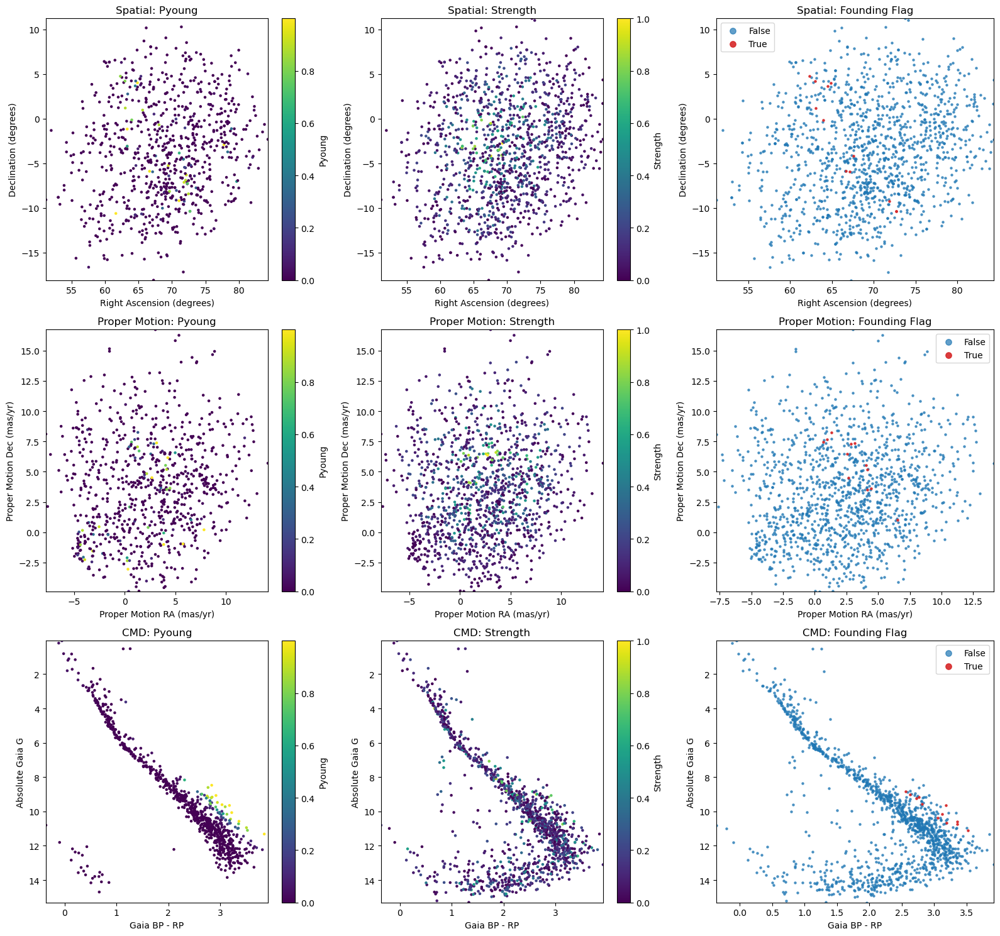

In [36]:
plot_continuous_and_founding_comparison(df_72)

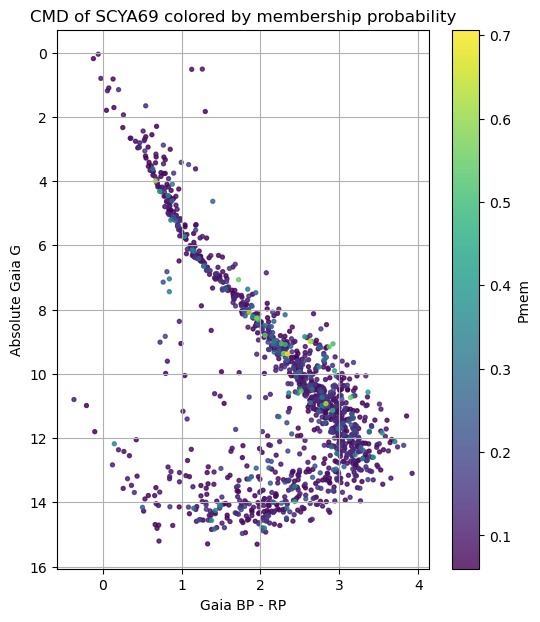

In [42]:
plot_cmd_highlight_overlay(df_72)

This is a diffuse cluster, we see founding stars and Pyoung that preferentially sits on the pre-main sequence
- Strength slightly centers overdensities in a certain region of the spatial and proper motion plots, with a small center of strength = 1 and then extending out to 0.4 which makes sense that its hard to tell as it is a diffuse cluster 

Problematically though, Pmem plot does not identify any robust pre main sequence. It appears at a lot of members are on the main sequence, and the arm curving down to the left too, which seems that it might be indicating that this might not be a clean compact cluster.
- It may be partially redenned or contaminated in some way